### Initialization

In [1]:
import pandas as pd
import mne
import numpy as np
from pathlib import Path
from utils.dataloaders import brainvision2raw
%matplotlib notebook

In [2]:
data_path = Path('./data/00010')
raw_origin, events, event_dict = brainvision2raw(data_path)
# raw_origin.plot_sensors(show_names=True)

Extracting parameters from data/00010/eeg/00010.vhdr...
Setting channel info structure...
Reading 0 ... 521926  =      0.000 ...  1043.852 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 3301 samples (6.602 sec)

Used Annotations descriptions: ['Stimulus/1', 'Stimulus/3']
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:    0.1s finished


In [3]:
# raw.plot(start=600, duration=50)

In [4]:
raw_origin.info

<Info | 9 non-empty values
 bads: []
 ch_names: F7, Fp1, Fp2, F8, F3, Fz, F4, C3, Cz, P8, P7, Pz, P4, T3, P3, ...
 chs: 20 EEG, 1 EOG, 1 ECG
 custom_ref_applied: True
 dig: 23 items (3 Cardinal, 20 EEG)
 highpass: 0.5 Hz
 lowpass: 60.0 Hz
 meas_date: unspecified
 nchan: 22
 projs: []
 sfreq: 500.0 Hz
>

In [5]:
# import pandas as pd
# import mne
# import numpy as np
# from pathlib import Path

# subj_path = Path('./data/00001')

# # Read files
# raw_origin = mne.io.read_raw_edf(subj_path/'00001.edf')
# events_origin = pd.read_csv(subj_path/'00001_crop_events.txt',header=None)
# psychopy_origin = pd.read_csv(subj_path/'00001_psychopy.csv')
# # print(events_origin, psychopy_origin.shape)


<IPython.core.display.Javascript object>


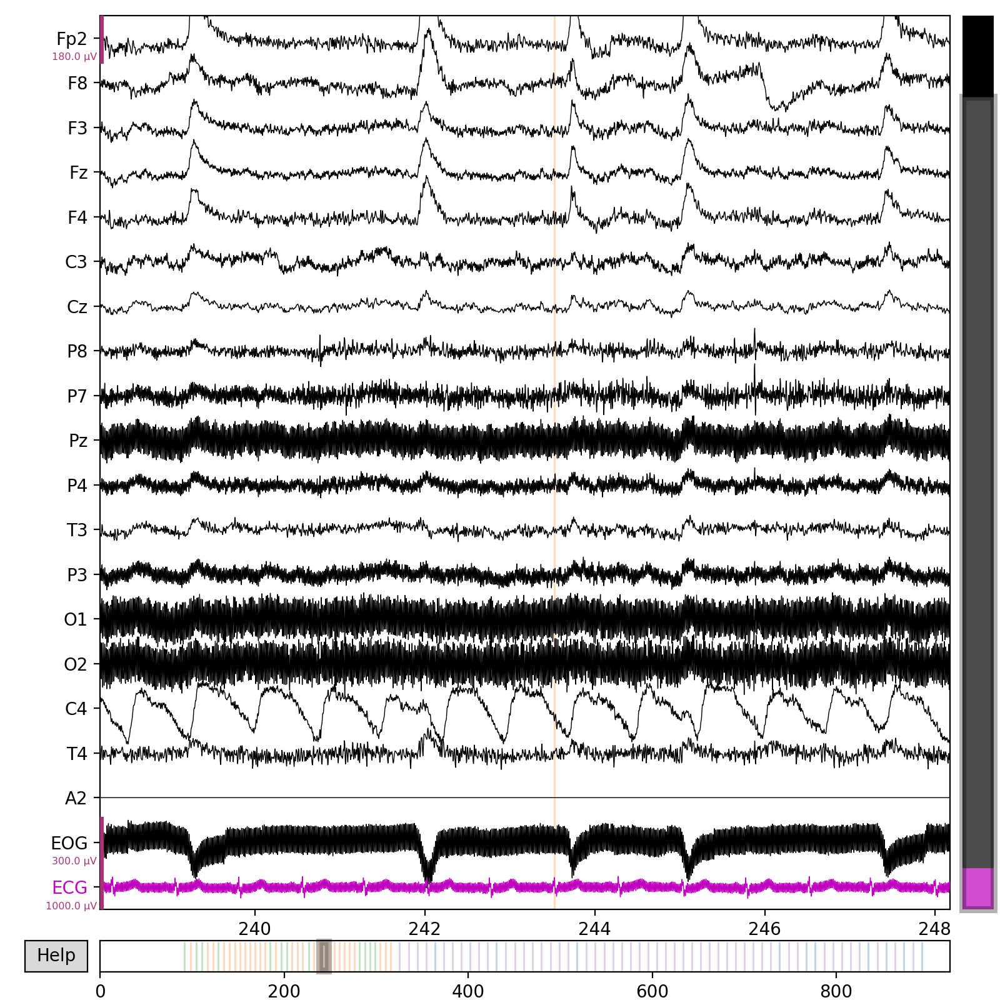

<IPython.core.display.Javascript object>


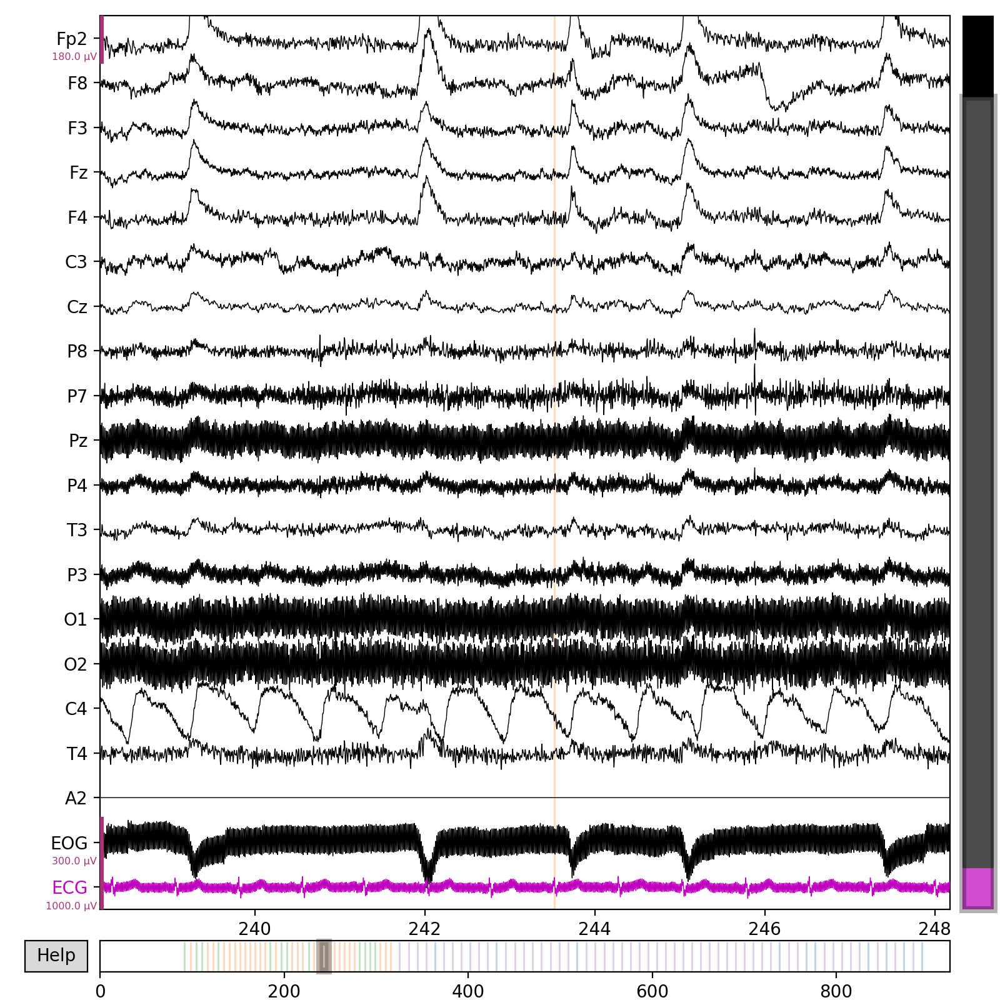

In [12]:
raw_origin.copy().plot(scalings={'eeg':90e-6})

### Reduce EOG

In [7]:
# Fit the regression model
from mne.preprocessing import EOGRegression
from matplotlib import pyplot as plt

weights = EOGRegression().fit(raw_origin)
raw_clean = weights.apply(raw_origin, copy=True)

# Show the filter weights in a topomap
# weights.plot()

No projector specified for this dataset. Please consider the method self.add_proj.
No projector specified for this dataset. Please consider the method self.add_proj.


<IPython.core.display.Javascript object>


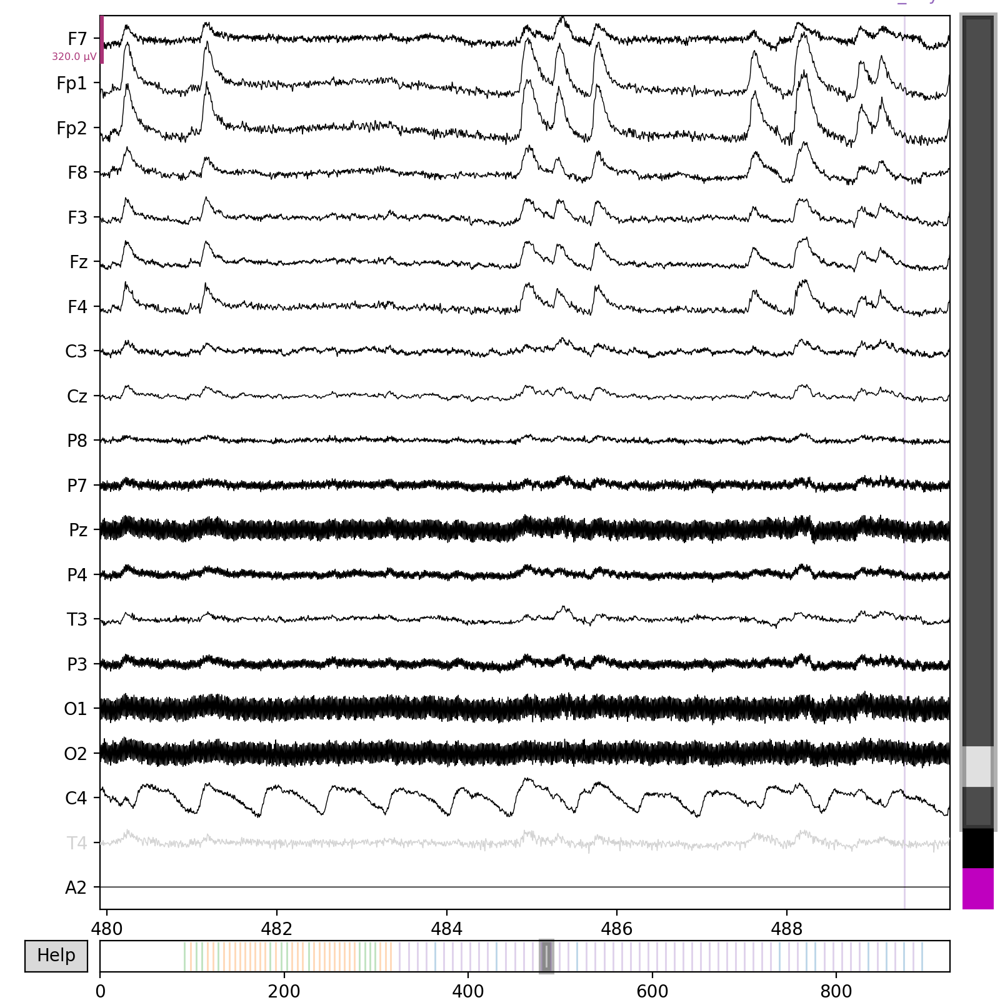

<IPython.core.display.Javascript object>


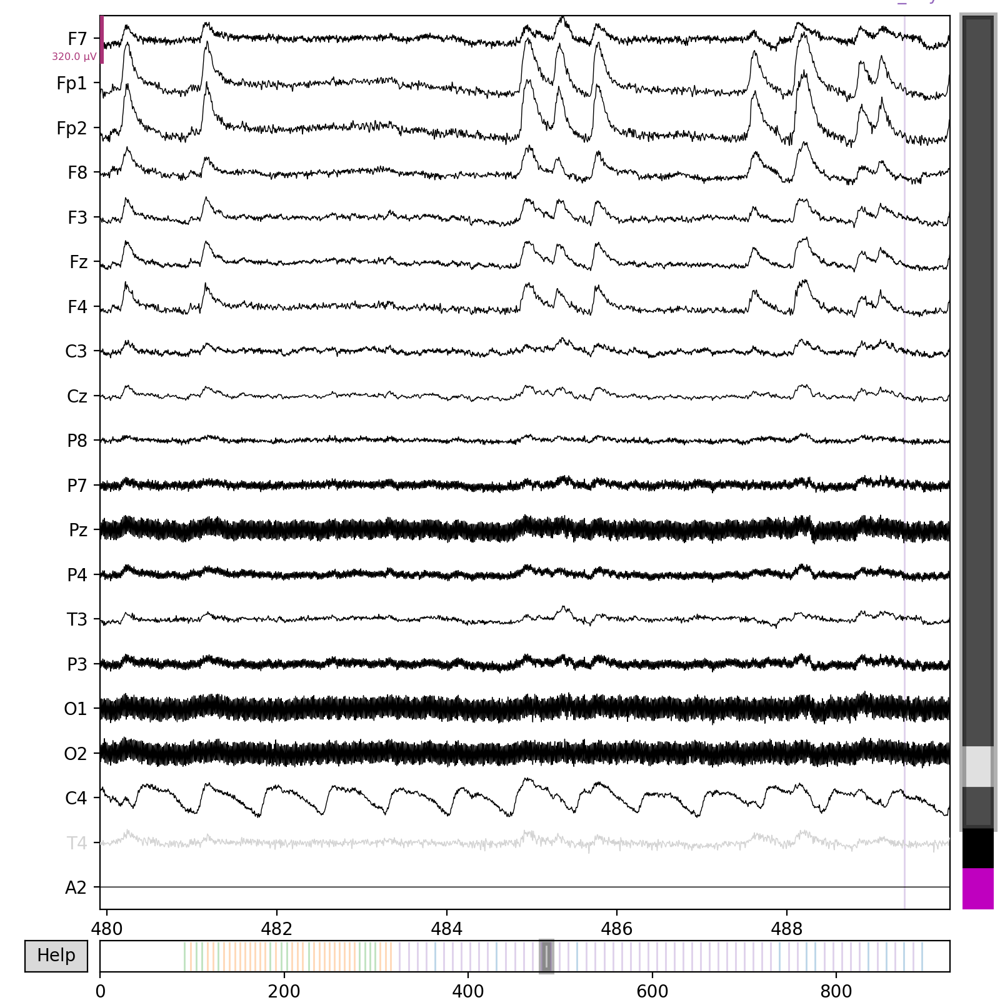

In [8]:
raw_clean.plot(scalings={'eeg':160e-6})

### Epochs

Not setting metadata
100 matching events found
Setting baseline interval to [-0.2, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 100 events and 2701 original time points ...
5 bad epochs dropped


<IPython.core.display.Javascript object>


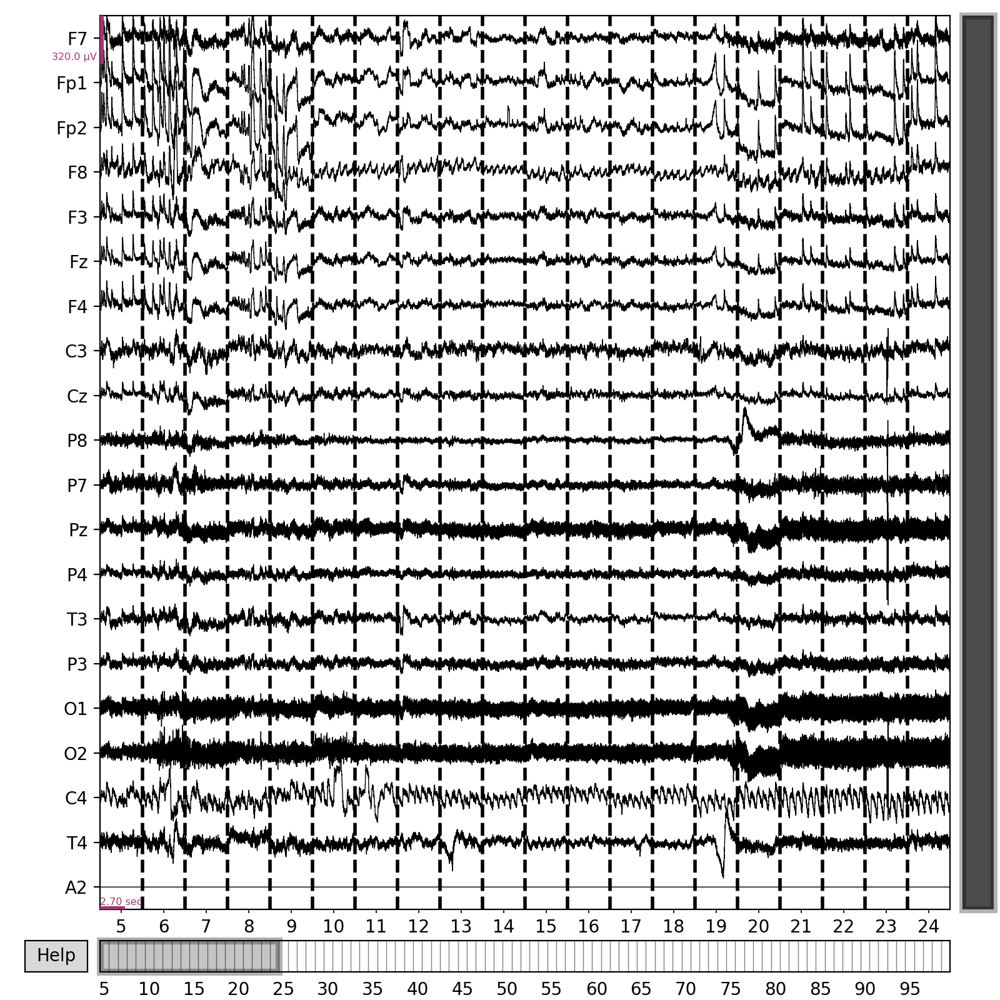

<IPython.core.display.Javascript object>


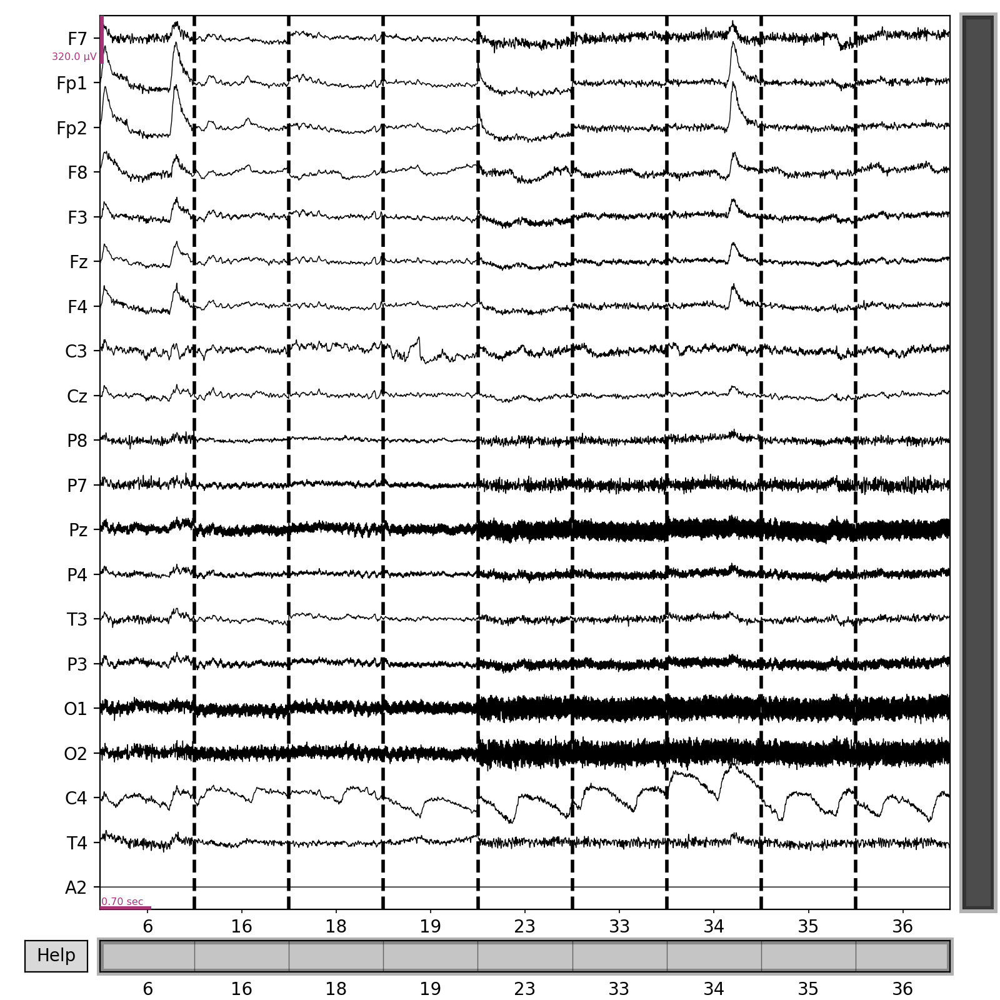

<IPython.core.display.Javascript object>


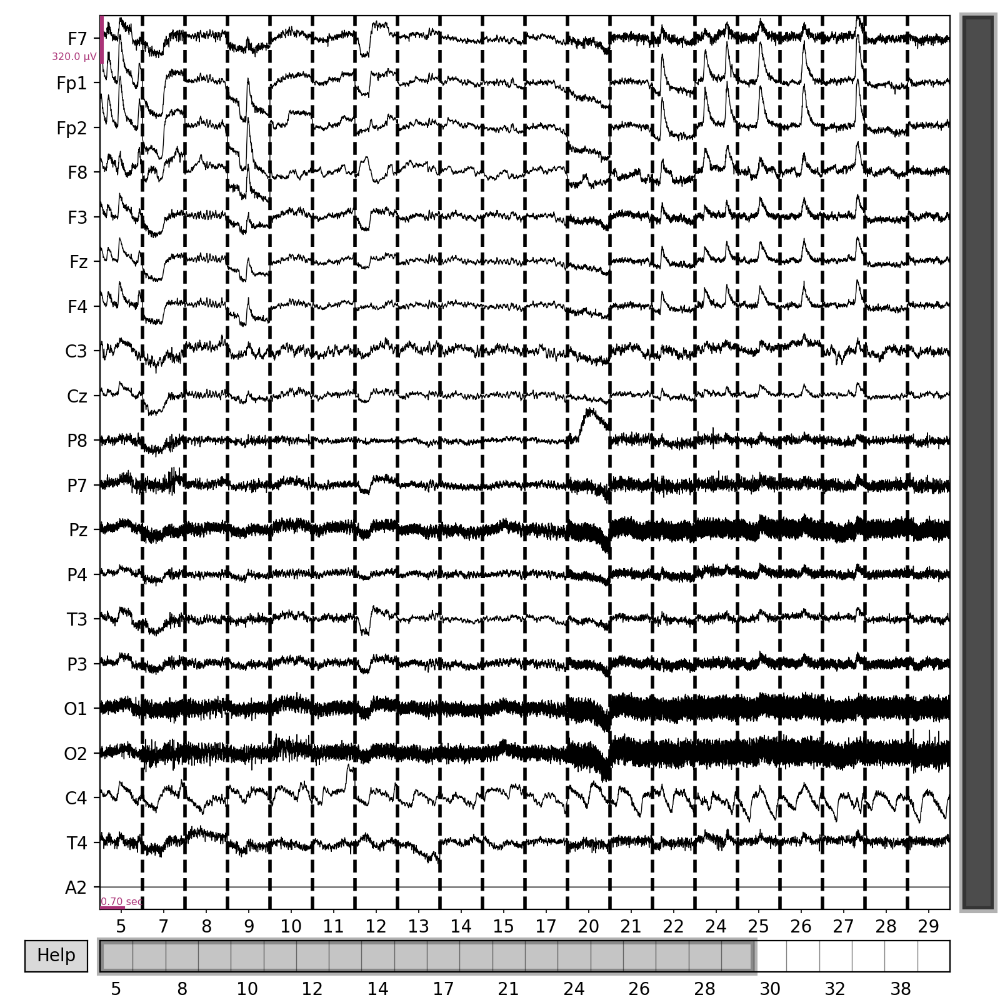

<IPython.core.display.Javascript object>


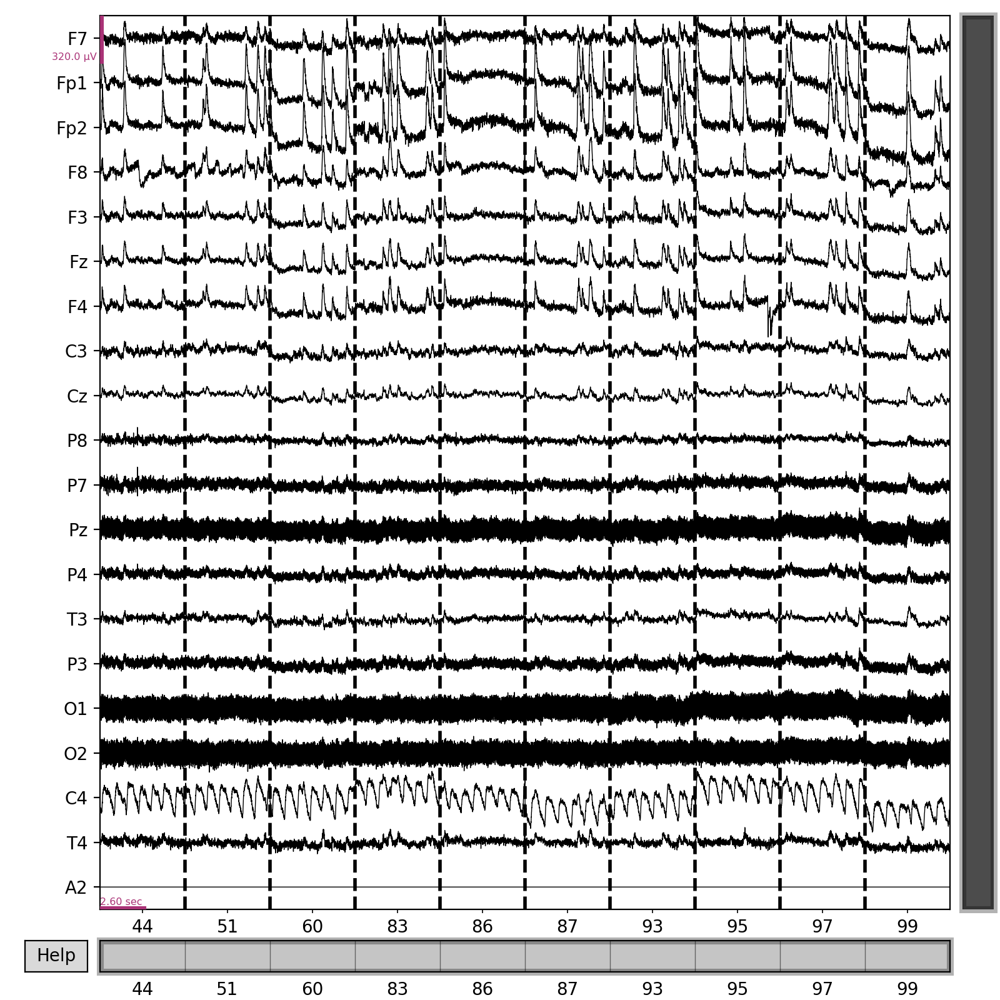

<IPython.core.display.Javascript object>


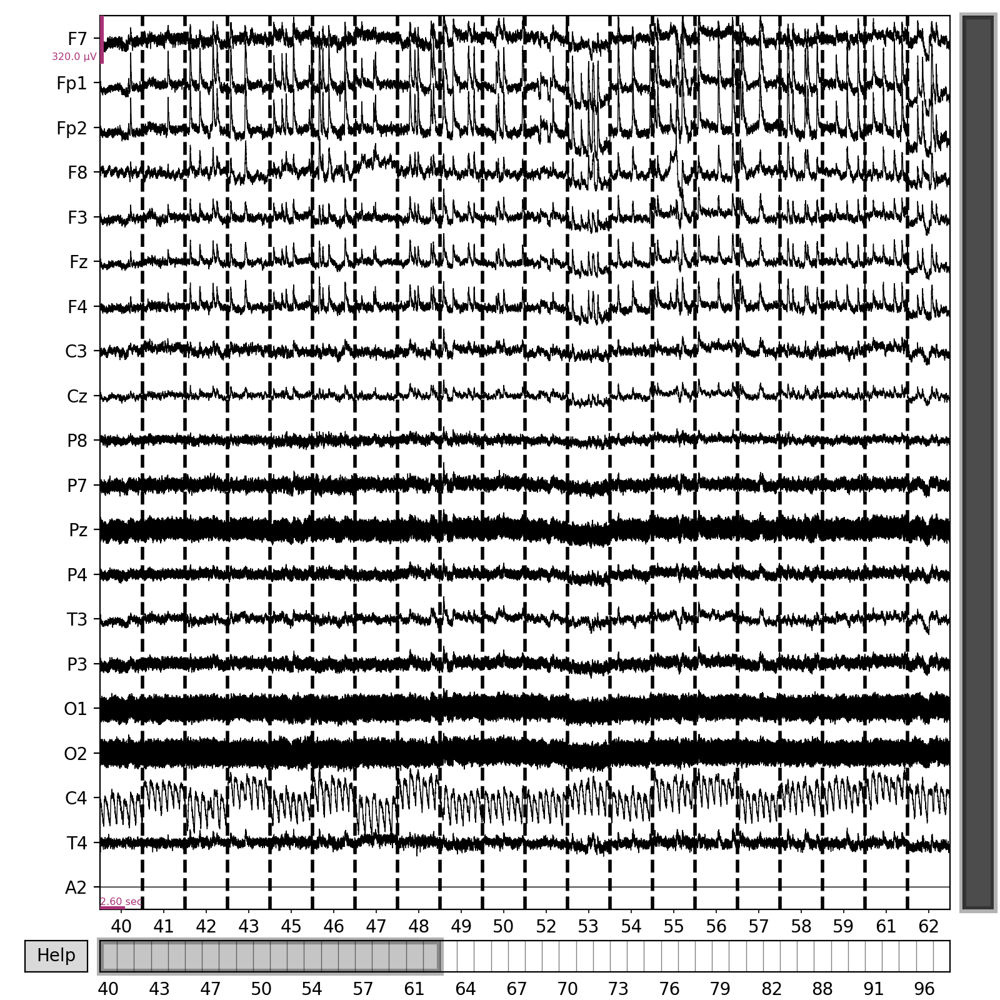

<IPython.core.display.Javascript object>


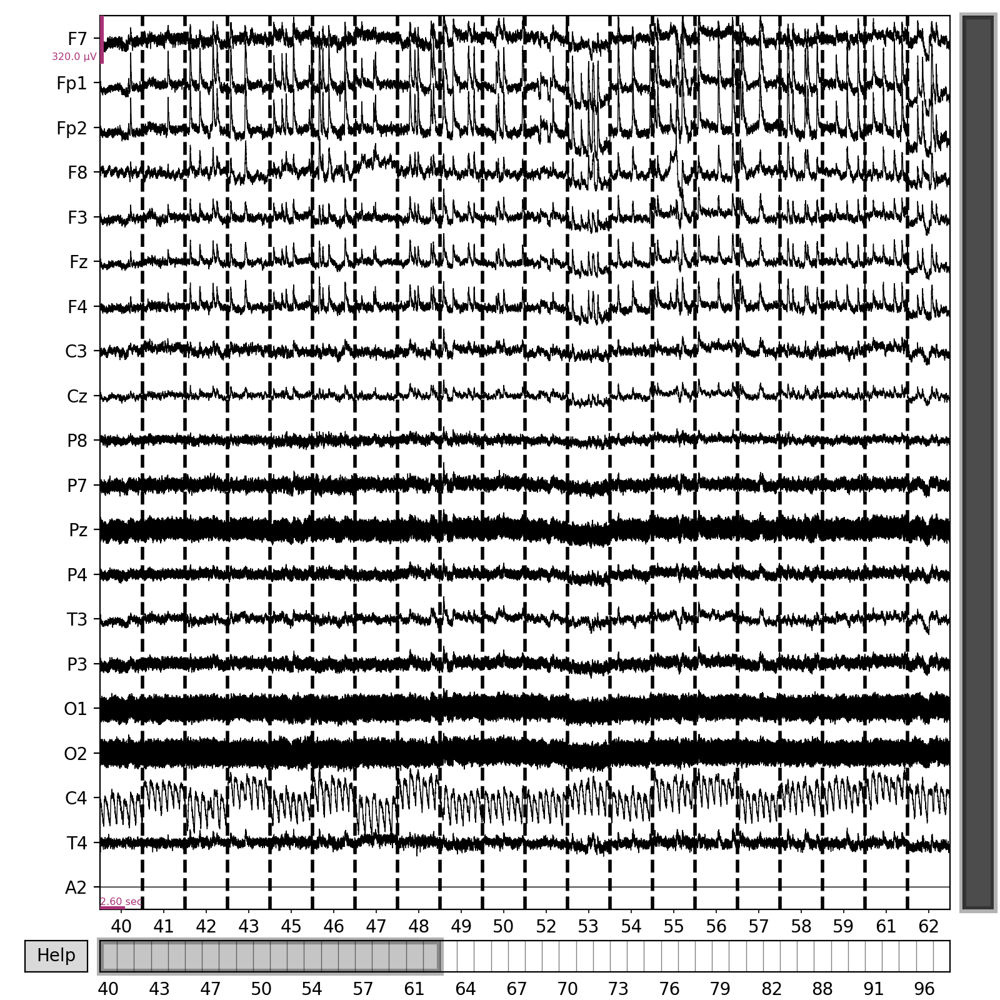

In [15]:

epochs = mne.Epochs(raw_clean, events, tmin=-0.2, tmax=5.2, event_id=event_dict,
                    preload=True)
epochs.plot(scalings={'eeg':160e-6})

epoch_like = epochs['like'].crop(tmin=0, tmax=1.4)
epoch_like.plot(events=events,event_id=event_dict,scalings={'eeg':160e-6})
epoch_dislike = epochs['dislike'].crop(tmin=0, tmax=1.4)
epoch_dislike.plot(events=events,event_id=event_dict,scalings={'eeg':160e-6})
epoch_buy = epochs['buy'].crop(tmin=0, tmax=5.2)
epoch_buy.plot(events=events,event_id=event_dict,scalings={'eeg':160e-6})
epoch_notbuy = epochs['not_buy'].crop(tmin=0, tmax=5.2)
epoch_notbuy.plot(events=events,event_id=event_dict,scalings={'eeg':160e-6})

### psd compute

    Using multitaper spectrum estimation with 7 DPSS windows


/tmp/ipykernel_29799/2464901694.py:2: UserWarning: Zero value in spectrum for channel A2
  epoch_like.compute_psd().plot_topomap()


<IPython.core.display.Javascript object>


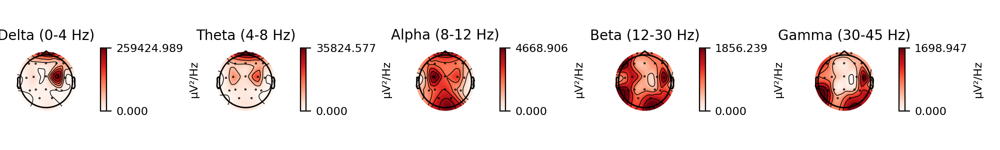

    Using multitaper spectrum estimation with 7 DPSS windows


/tmp/ipykernel_29799/2464901694.py:5: UserWarning: Zero value in spectrum for channel A2
  epoch_dislike.compute_psd().plot_topomap()


<IPython.core.display.Javascript object>


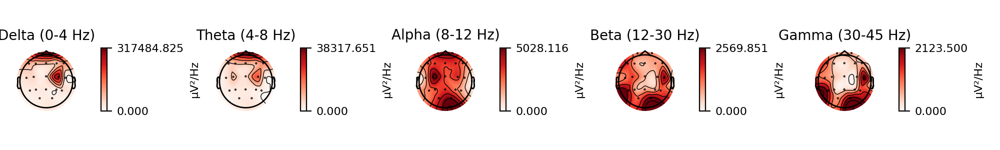

    Using multitaper spectrum estimation with 7 DPSS windows


/tmp/ipykernel_29799/2464901694.py:8: UserWarning: Zero value in spectrum for channel A2
  epoch_buy.compute_psd().plot_topomap()


<IPython.core.display.Javascript object>


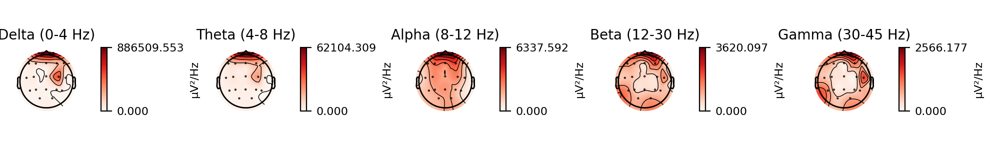

    Using multitaper spectrum estimation with 7 DPSS windows


/tmp/ipykernel_29799/2464901694.py:11: UserWarning: Zero value in spectrum for channel A2
  epoch_notbuy.compute_psd().plot_topomap()


<IPython.core.display.Javascript object>


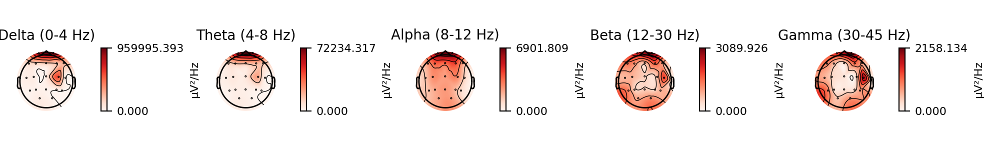

<IPython.core.display.Javascript object>


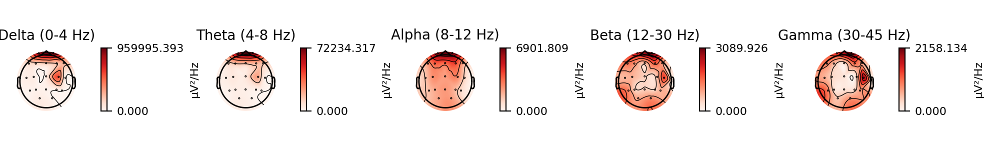

In [10]:
# epoch_like.compute_psd(n_jobs=-1).plot_topomap().savefig('./00003_epoch_like.png')
epoch_like.compute_psd().plot_topomap()

# epoch_dislike.compute_psd(n_jobs=-1).plot_topomap().savefig('./00003_epoch_dislike.png')
epoch_dislike.compute_psd().plot_topomap()

# epoch_buy.compute_psd(n_jobs=-1).plot_topomap().savefig('./00003_epoch_buy.png')
epoch_buy.compute_psd().plot_topomap()

# epoch_notbuy.compute_psd(n_jobs=-1).plot_topomap().savefig('./00003_epoch_notbuy.png')
epoch_notbuy.compute_psd().plot_topomap()

<IPython.core.display.Javascript object>


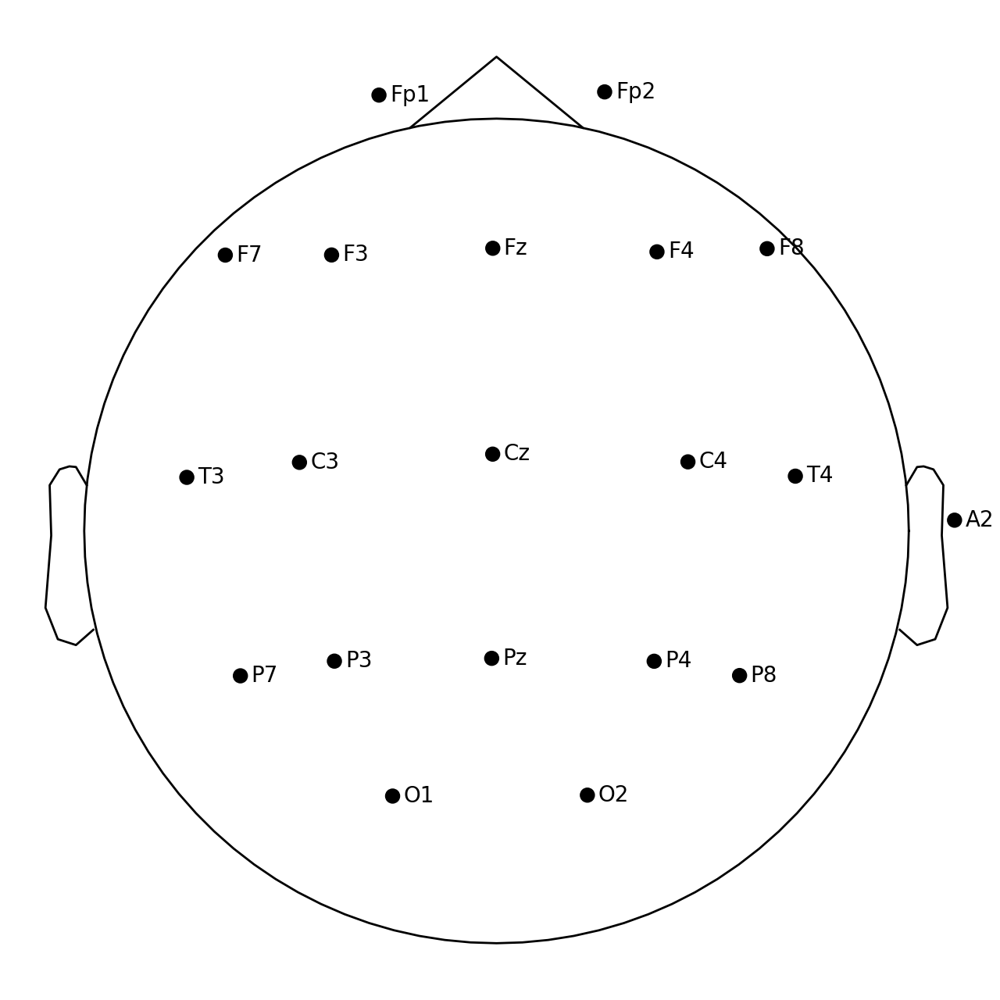

<IPython.core.display.Javascript object>


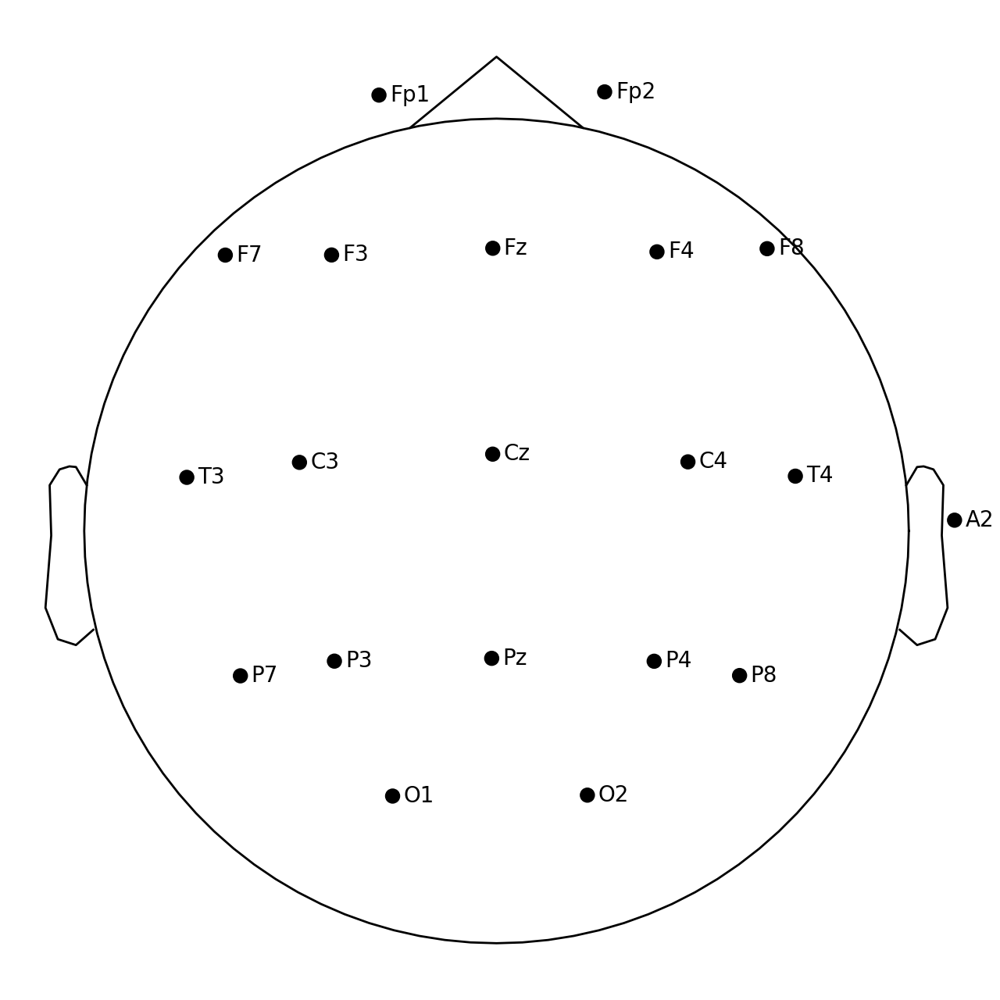

In [11]:
# raw.plot_sensors(show_names=True).savefig('./00003_montage.png')
raw_origin.plot_sensors(show_names=True)